# Azure OpenAI benchmarks

This notebook is using the GitGub repo from Microsoft: https://github.com/Azure/azure-openai-benchmark

<img src="image (1).jpg" width=600>
<img src="image (2).jpg" width=600>
<img src="image (3).jpg" width=600>
<img src="image (4).jpg" width=600>

In [1]:
import datetime
import json
import matplotlib.pyplot as plt
import openai
import os
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
import shutil
import subprocess
import sweetviz as sv
import sys
import time

from plotly.subplots import make_subplots

In [2]:
print(f"Today is {str(datetime.datetime.today())}")

Today is 2024-06-19 09:13:59.869129


In [3]:
sys.version

'3.10.11 (main, May 16 2023, 00:28:57) [GCC 11.2.0]'

In [4]:
%%javascript Python 
OutputArea.auto_scroll_threshold = 9999

<IPython.core.display.Javascript object>

## 1. Settings

In [5]:
HOME = os.getcwd()
HOME

'/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks'

In [6]:
RESULTS_DIR = "results"

os.makedirs(RESULTS_DIR, exist_ok=True)

In [7]:
DIR_BENCHMARK = 'azure-openai-benchmark'

shutil.rmtree(DIR_BENCHMARK)

In [8]:
!git clone https://github.com/Azure/azure-openai-benchmark

Cloning into 'azure-openai-benchmark'...
remote: Enumerating objects: 224, done.
remote: Counting objects: 100% (158/158), done.
remote: Compressing objects: 100% (53/53), done.
remote: Total 224 (delta 129), reused 105 (delta 105), pack-reused 66
Receiving objects: 100% (224/224), 59.84 KiB | 167.00 KiB/s, done.
Resolving deltas: 100% (137/137), done.


In [9]:
os.chdir(DIR_BENCHMARK)

In [10]:
#!pip install -r requirements.txt

In [11]:
os.getcwd()

'/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/azure-openai-benchmark'

## 2. Models to benchmark

In [12]:
# Your Azure OpenAI endpoint
MODEL_ENDPOINT = "TOBEREPLACED"

# Replace the value with your Azure OpenAI key
os.environ['OPENAI_API_KEY'] = "TOBEREPLACED"

In [13]:
# Models to compare. You can choose PayGO models or PTU deployed models
MODEL1 = "gpt-4o"
MODEL2 = "gpt-4-turbo-2024-04-09"

## 3. Syntax

In [14]:
!python -m benchmark.bench load --help

usage: bench.py load [-h] [-a API_VERSION] [-k API_KEY_ENV] [-c CLIENTS]
                     [-n REQUESTS] [-d DURATION] [-r RATE]
                     [-w AGGREGATION_WINDOW]
                     [-s {balanced,context,generation,custom}]
                     [-p CONTEXT_TOKENS] [-m MAX_TOKENS] [-i COMPLETIONS]
                     [--frequency-penalty FREQUENCY_PENALTY]
                     [--presence-penalty PRESENCE_PENALTY]
                     [--temperature TEMPERATURE] [--top-p TOP_P]
                     [-f {jsonl,human}] [-t {none,exponential}] -e DEPLOYMENT
                     api_base_endpoint

positional arguments:
  api_base_endpoint     Azure OpenAI deployment base endpoint.

optional arguments:
  -h, --help            show this help message and exit
  -a API_VERSION, --api-version API_VERSION
                        Set OpenAI API version.
  -k API_KEY_ENV, --api-key-env API_KEY_ENV
                        Environment variable that contains the API KEY.
  -c CLIENTS,

## 4. Quick test using GPT-4o

In [15]:
MODEL1

'gpt-4o'

In [16]:
command = [
    'python', '-m', 'benchmark.bench', 'load', 
    '--deployment', MODEL1,  # Model to use
    '--rate', '10',  # RPM
    '--retry', 'exponential',  # Retry
    '--duration', '30',  # Duration in seconds
    MODEL_ENDPOINT  # Model endpoint to use
]

# Run the command
start = time.time()
now = datetime.datetime.today()
print(f"{now} Running benchmarks for model {MODEL1}...")
result = subprocess.run(command, capture_output=True, text=True)
elapsed = time.time() - start
print("Done")
print("Elapsed time: " + time.strftime(
    "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

2024-06-19 09:14:29.498280 Running benchmarks for model gpt-4o...
Done
Elapsed time: 00:00:38.802393


In [17]:
print(result.stdout)

2024-06-19 09:14:33 rpm: n/a   processing: 2    completed: 0     failures: 0    throttled: 0    requests: 0     tpm: 0      ttft_avg: n/a    ttft_95th: n/a    tbt_avg: n/a    tbt_95th: n/a    e2e_avg: n/a    e2e_95th: n/a    util_avg: n/a    util_95th: n/a   
2024-06-19 09:14:34 rpm: n/a   processing: 2    completed: 0     failures: 0    throttled: 0    requests: 0     tpm: 0      ttft_avg: n/a    ttft_95th: n/a    tbt_avg: n/a    tbt_95th: n/a    e2e_avg: n/a    e2e_95th: n/a    util_avg: n/a    util_95th: n/a   
2024-06-19 09:14:35 rpm: n/a   processing: 2    completed: 0     failures: 0    throttled: 0    requests: 0     tpm: 0      ttft_avg: n/a    ttft_95th: n/a    tbt_avg: n/a    tbt_95th: n/a    e2e_avg: n/a    e2e_95th: n/a    util_avg: n/a    util_95th: n/a   
2024-06-19 09:14:36 rpm: n/a   processing: 2    completed: 0     failures: 0    throttled: 0    requests: 0     tpm: 0      ttft_avg: n/a    ttft_95th: n/a    tbt_avg: n/a    tbt_95th: n/a    e2e_avg: n/a    e2e_95th: n/

In [18]:
print(result.stderr)

2024-06-19 09:14:30 INFO     using shape profile balanced: context tokens: 500, max tokens: 500
2024-06-19 09:14:30 INFO     warming up prompt cache
2024-06-19 09:14:32 INFO     starting load...
2024-06-19 09:15:02 INFO     waiting for 6 requests to drain
2024-06-19 09:15:08 INFO     finished load test



## 5. Advanced testing with model 1 (GPT-4o)

In [19]:
print(f"Benchmarks for model {MODEL1}")

Benchmarks for model gpt-4o


In [20]:
# With output file generation
OUTPUT_FILE = os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL1}.txt")

command = [
    'python', '-m', 'benchmark.bench', 'load',
    '--deployment', MODEL1,  # Model to use
    '--rate', '10',  # RPM
    '--duration', '300',  # Duration in seconds (should be > 30)
    '--output-format', 'human',  # Output format
    MODEL_ENDPOINT  # Model endpoint to use
]

# Running the benchmarks
start = time.time()
now = datetime.datetime.today()
print(f"{now} Running benchmarks for model {MODEL1}...")
result = subprocess.run(command, capture_output=True, text=True)
elapsed = time.time() - start

# Saving the results into a file
with open(OUTPUT_FILE, 'w') as f:
    f.write(result.stdout)

print(f"Benchmark output saved to file {OUTPUT_FILE}")
print("Elapsed time: " + time.strftime(
    "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

2024-06-19 09:15:08.336510 Running benchmarks for model gpt-4o...
Benchmark output saved to file /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/benchmarks_gpt-4o.txt
Elapsed time: 00:05:06.956696


In [21]:
# Init
timestamps = []
rpm_values = []
processing_values = []
completed_values = []
failures_values = []
throttled_values = []
requests_values = []
tpm_values = []
ttft_avg_values = []
ttft_95th_values = []
tbt_avg_values = []
tbt_95th_values = []
e2e_avg_values = []
e2e_95th_values = []
util_avg_values = []
util_95th_values = []

# Reading file
with open(OUTPUT_FILE, 'r') as file:
    for line in file:
        fields = line.strip().split()
        timestamp = ' '.join(fields[0:2])
        timestamps.append(timestamp)
        rpm_values.append(fields[3])
        processing_values.append(fields[5])
        completed_values.append(fields[7])
        failures_values.append(fields[9])
        throttled_values.append(fields[11])
        requests_values.append(fields[13])
        tpm_values.append(fields[15])
        ttft_avg_values.append(fields[17])
        ttft_95th_values.append(fields[19])
        tbt_avg_values.append(fields[21])
        tbt_95th_values.append(fields[23])
        e2e_avg_values.append(fields[25])
        e2e_95th_values.append(fields[27])
        util_avg_values.append(fields[29])
        util_95th_values.append(fields[31])

df1 = pd.DataFrame({
    'timestamp': timestamps,
    'rpm': rpm_values,
    'processing': processing_values,
    'completed': completed_values,
    'failures': failures_values,
    'throttled': throttled_values,
    'requests': requests_values,
    'tpm': tpm_values,
    'ttft_avg': ttft_avg_values,
    'ttft_95th': ttft_95th_values,
    'tbt_avg': tbt_avg_values,
    'tbt_95th': tbt_95th_values,
    'e2e_avg': e2e_avg_values,
    'e2e_95th': e2e_95th_values,
    'util_avg': util_avg_values,
    'util_95th': util_95th_values
})

df1 = df1.replace('n/a', 0)
df1['rpm'] = df1['rpm'].astype(float)
df1['processing'] = df1['processing'].astype(int)
df1['completed'] = df1['completed'].astype(int)
df1['failures'] = df1['failures'].astype(int)
df1['throttled'] = df1['throttled'].astype(int)
df1['requests'] = df1['requests'].astype(int)
df1['tpm'] = df1['tpm'].astype(float)
df1['ttft_avg'] = df1['ttft_avg'].astype(float)
df1['ttft_95th'] = df1['ttft_95th'].astype(float)
df1['tbt_avg'] = df1['tbt_avg'].astype(float)
df1['tbt_95th'] = df1['tbt_95th'].astype(float)
df1['e2e_avg'] = df1['e2e_avg'].astype(float)
df1['e2e_95th'] = df1['e2e_95th'].astype(float)
df1['e2e_95th'] = df1['e2e_95th'].astype(float)
df1['model'] = MODEL1

In [22]:
df1

,timestamp,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th,model
0,2024-06-19 09:15:10,0.0,2,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0,0,gpt-4o
1,2024-06-19 09:15:11,0.0,2,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0,0,gpt-4o
2,2024-06-19 09:15:12,0.0,2,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0,0,gpt-4o
3,2024-06-19 09:15:13,0.0,2,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0,0,gpt-4o
4,2024-06-19 09:15:14,0.0,2,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0,0,gpt-4o
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
300,2024-06-19 09:20:11,8.0,1,45,0,0,45,8024.0,0.159,0.244,0.011,0.012,5.685,6.567,0,0,gpt-4o
301,2024-06-19 09:20:12,8.0,1,45,0,0,45,8024.0,0.159,0.244,0.011,0.012,5.685,6.567,0,0,gpt-4o
302,2024-06-19 09:20:13,8.0,1,45,0,0,45,8024.0,0.159,0.244,0.011,0.012,5.685,6.567,0,0,gpt-4o
303,2024-06-19 09:20:14,8.0,1,45,0,0,45,8024.0,0.159,0.244,0.011,0.012,5.685,6.567,0,0,gpt-4o


In [23]:
df1.describe()

,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th
count,305.000000,305.000000,305.000000,305.0,305.0,305.000000,305.000000,305.000000,305.000000,305.000000,305.000000,305.000000,305.000000,305.0,305.0
mean,8.401311,0.862295,23.065574,0.0,0.0,23.065574,8426.780328,0.266941,0.532649,0.010561,0.011915,5.635859,6.407711,0.0,0.0
std,1.614734,0.538689,13.229339,0.0,0.0,13.229339,1621.406442,0.180648,0.402593,0.001574,0.002055,0.810148,0.913298,0.0,0.0
min,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,8.000000,1.000000,12.000000,0.0,0.0,12.000000,8024.000000,0.158000,0.244000,0.010000,0.011000,5.685000,6.464000,0.0,0.0
50%,8.000000,1.000000,23.000000,0.0,0.0,23.000000,8024.000000,0.179000,0.331000,0.011000,0.012000,5.724000,6.523000,0.0,0.0
75%,9.000000,1.000000,34.000000,0.0,0.0,34.000000,9027.000000,0.256000,0.576000,0.011000,0.013000,5.740000,6.589000,0.0,0.0
max,17.100000,2.000000,46.000000,0.0,0.0,46.000000,17194.000000,0.746000,1.334000,0.012000,0.014000,6.301000,6.715000,0.0,0.0


In [24]:
cols_to_plot = [
    "rpm", "failures", "tpm", "ttft_avg", "ttft_95th", "tbt_avg", "tbt_95th",
    "e2e_avg", "e2e_95th"
]

### 5.1 Lineplots using Plotly

In [25]:
for col in cols_to_plot:
    fig = px.line(df1,
                  x=df1.index,
                  y=df1[col],
                  title=f'{col} for model {MODEL1}')
    fig.show()

### 5.2 Lineplots using Seaborn

In [26]:
df1 = df1.reset_index()

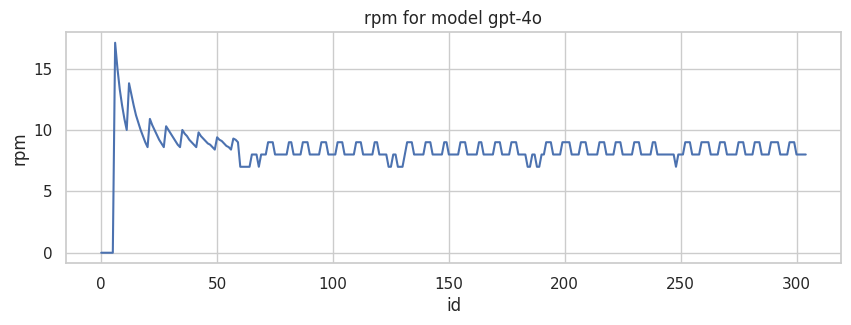

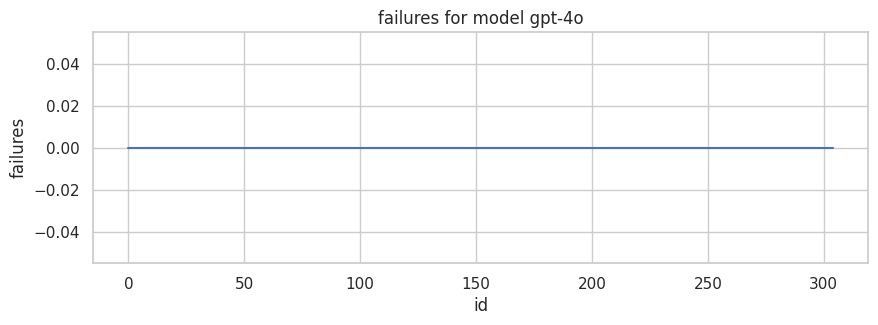

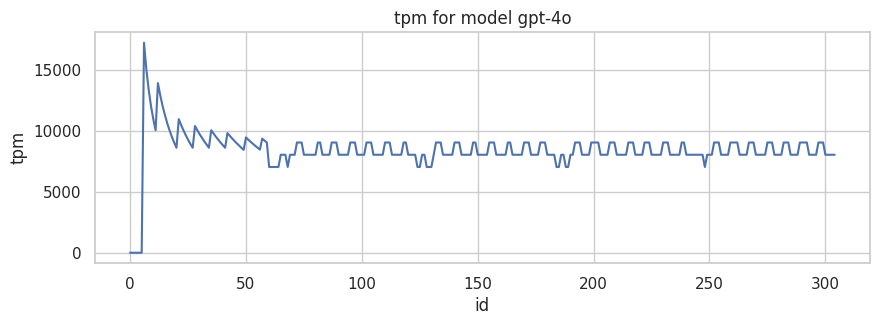

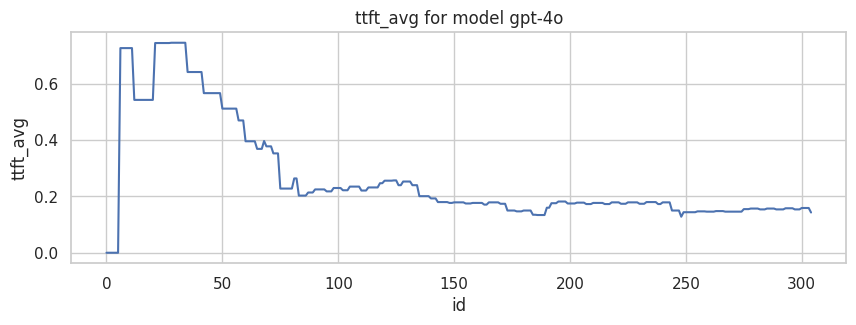

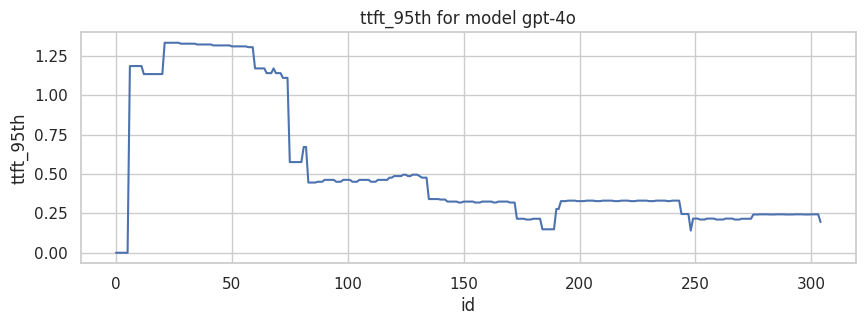

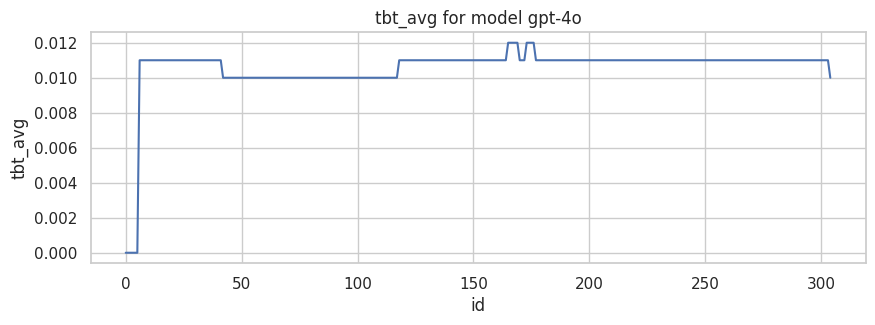

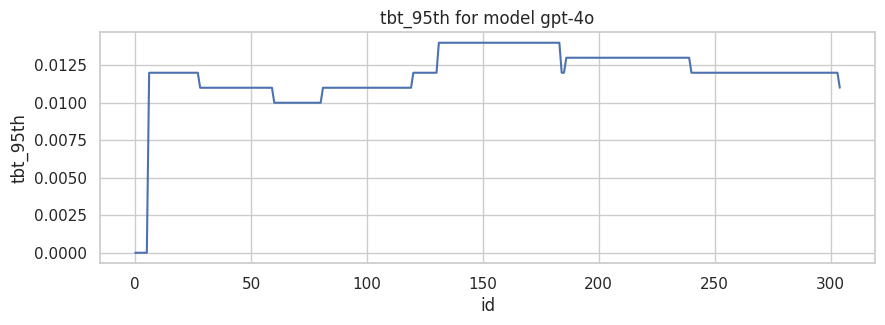

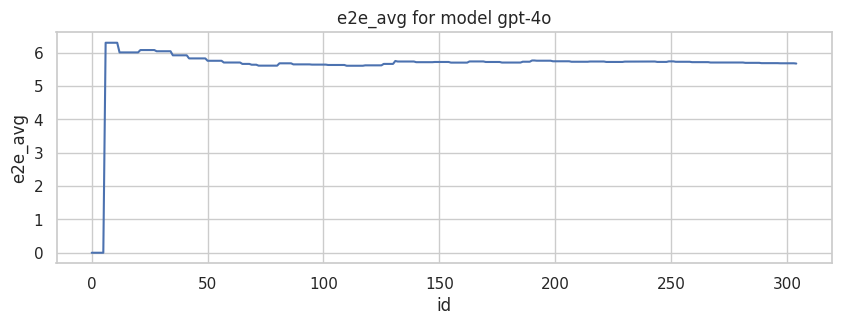

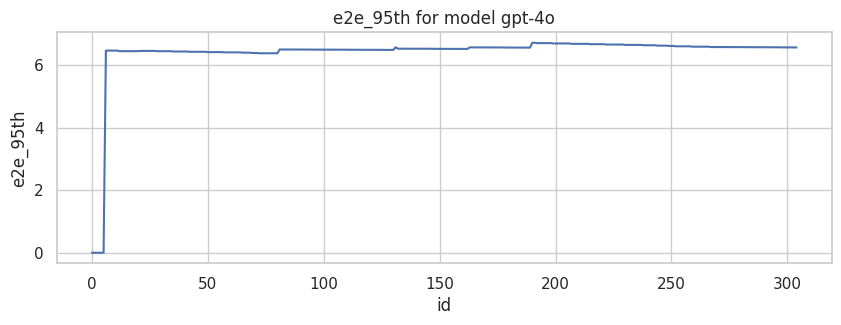

In [27]:
sns.set(style="whitegrid")

for col in cols_to_plot:
    plt.figure(figsize=(10, 3))
    sns.lineplot(data=df1, x='index', y=col)
    plt.title(f'{col} for model {MODEL1}')
    plt.xlabel('id')
    plt.ylabel(col)
    plt.show()

### 5.3 Boxplots using Plotly

In [28]:
for col in cols_to_plot:
    fig = px.box(df1, y=df1[col], title=f'{col} for model {MODEL1}')
    fig.show()

### 5.4 Boxplots using Seaborn

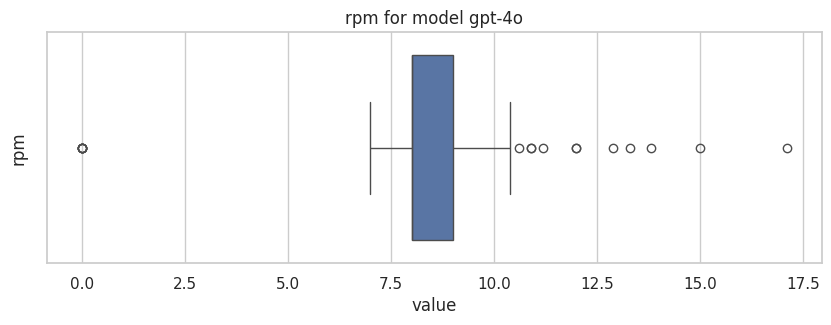

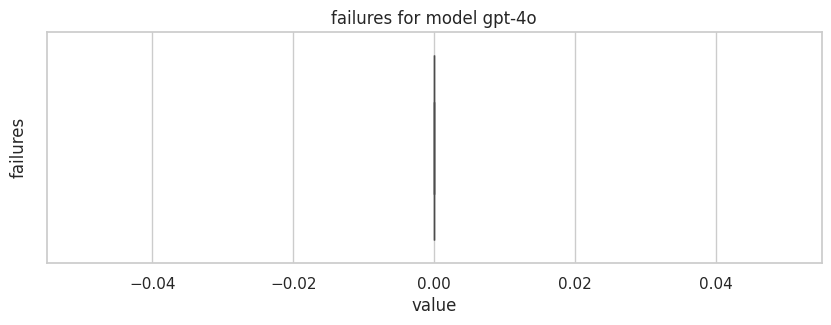

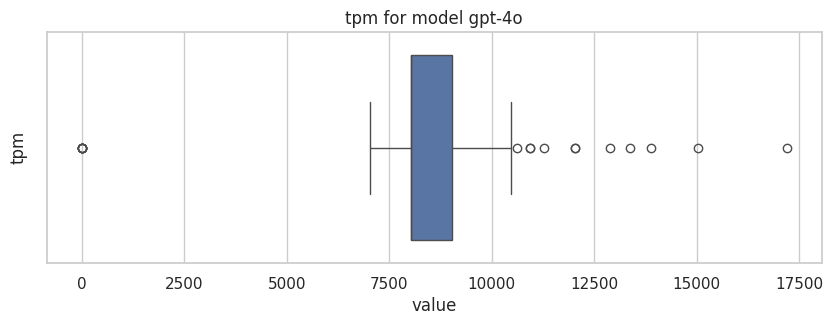

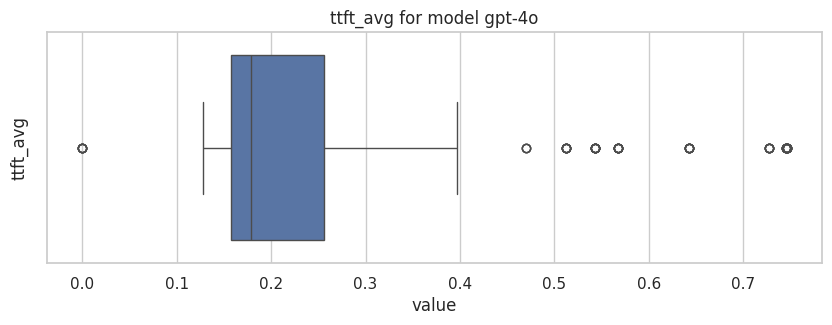

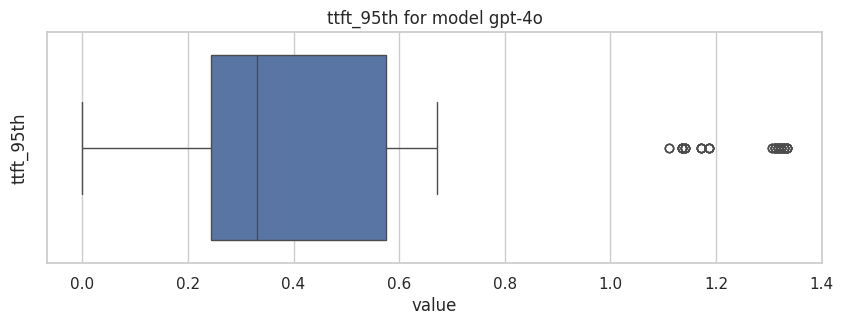

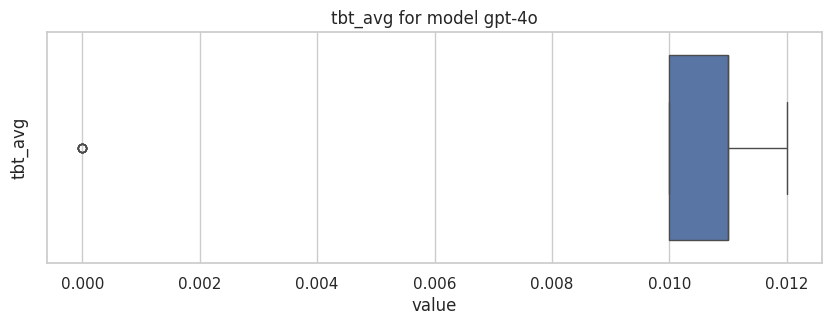

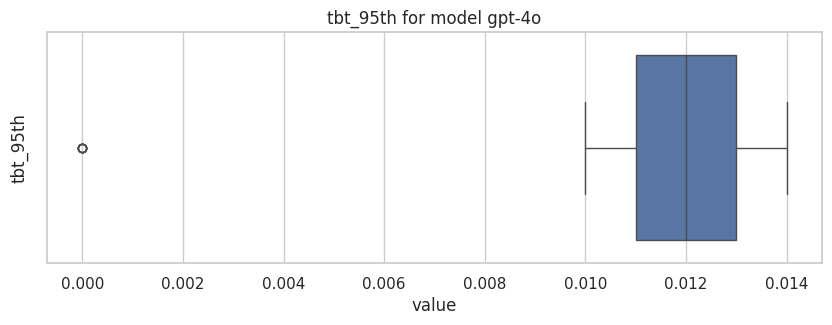

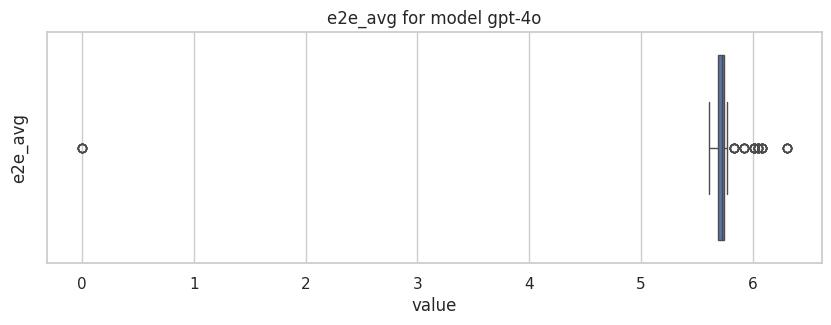

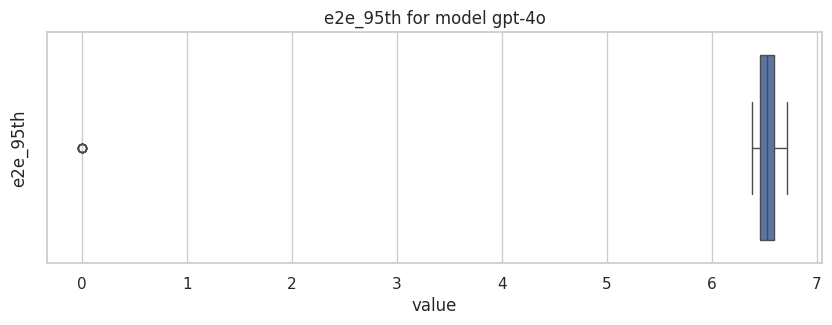

In [29]:
sns.set(style="whitegrid")

for col in cols_to_plot:
    plt.figure(figsize=(10, 3))
    sns.boxplot(x=df1[col])
    plt.title(f'{col} for model {MODEL1}')
    plt.xlabel('value')
    plt.ylabel(col)
    plt.show()

## 6. Comparing benchmarks

### 6.1 Running benchmarks from the second model

In [30]:
print(f"Benchmarks for model {MODEL2}")

Benchmarks for model gpt-4-turbo-2024-04-09


In [31]:
# With output file generation
OUTPUT_FILE = os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL2}.txt")

command = [
    'python', '-m', 'benchmark.bench', 'load',
    '--deployment', MODEL2,  # Model to use
    '--rate', '10',  # RPM
    '--duration', '300',  # Duration in seconds (should be > 30)
    '--output-format', 'human',  # Output format
    MODEL_ENDPOINT  # Model endpoint to use
]

# Running the benchmarks
start = time.time()
now = datetime.datetime.today()
print(f"{now} Running benchmarks for model {MODEL2}...")
result = subprocess.run(command, capture_output=True, text=True)
elapsed = time.time() - start

# Saving the results into a file
with open(OUTPUT_FILE, 'w') as f:
    f.write(result.stdout)

print(f"Benchmark output saved to file {OUTPUT_FILE}")
print("Elapsed time: " + time.strftime(
    "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

2024-06-19 09:20:23.199632 Running benchmarks for model gpt-4-turbo-2024-04-09...
Benchmark output saved to file /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/benchmarks_gpt-4-turbo-2024-04-09.txt
Elapsed time: 00:05:32.162916


In [32]:
# Init
timestamps = []
rpm_values = []
processing_values = []
completed_values = []
failures_values = []
throttled_values = []
requests_values = []
tpm_values = []
ttft_avg_values = []
ttft_95th_values = []
tbt_avg_values = []
tbt_95th_values = []
e2e_avg_values = []
e2e_95th_values = []
util_avg_values = []
util_95th_values = []

# Reading file
with open(OUTPUT_FILE, 'r') as file:
    for line in file:
        fields = line.strip().split()
        timestamp = ' '.join(fields[0:2])
        timestamps.append(timestamp)
        rpm_values.append(fields[3])
        processing_values.append(fields[5])
        completed_values.append(fields[7])
        failures_values.append(fields[9])
        throttled_values.append(fields[11])
        requests_values.append(fields[13])
        tpm_values.append(fields[15])
        ttft_avg_values.append(fields[17])
        ttft_95th_values.append(fields[19])
        tbt_avg_values.append(fields[21])
        tbt_95th_values.append(fields[23])
        e2e_avg_values.append(fields[25])
        e2e_95th_values.append(fields[27])
        util_avg_values.append(fields[29])
        util_95th_values.append(fields[31])

df2 = pd.DataFrame({
    'timestamp': timestamps,
    'rpm': rpm_values,
    'processing': processing_values,
    'completed': completed_values,
    'failures': failures_values,
    'throttled': throttled_values,
    'requests': requests_values,
    'tpm': tpm_values,
    'ttft_avg': ttft_avg_values,
    'ttft_95th': ttft_95th_values,
    'tbt_avg': tbt_avg_values,
    'tbt_95th': tbt_95th_values,
    'e2e_avg': e2e_avg_values,
    'e2e_95th': e2e_95th_values,
    'util_avg': util_avg_values,
    'util_95th': util_95th_values
})

df2 = df2.replace('n/a', 0)
df2['rpm'] = df2['rpm'].astype(float)
df2['processing'] = df2['processing'].astype(int)
df2['completed'] = df2['completed'].astype(int)
df2['failures'] = df2['failures'].astype(int)
df2['throttled'] = df2['throttled'].astype(int)
df2['requests'] = df2['requests'].astype(int)
df2['tpm'] = df2['tpm'].astype(float)
df2['ttft_avg'] = df2['ttft_avg'].astype(float)
df2['ttft_95th'] = df2['ttft_95th'].astype(float)
df2['tbt_avg'] = df2['tbt_avg'].astype(float)
df2['tbt_95th'] = df2['tbt_95th'].astype(float)
df2['e2e_avg'] = df2['e2e_avg'].astype(float)
df2['e2e_95th'] = df2['e2e_95th'].astype(float)
df2['e2e_95th'] = df2['e2e_95th'].astype(float)
df2['model'] = MODEL2

In [33]:
df2

,timestamp,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th,model
0,2024-06-19 09:20:25,0.0,2,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0,0,gpt-4-turbo-2024-04-09
1,2024-06-19 09:20:26,0.0,2,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0,0,gpt-4-turbo-2024-04-09
2,2024-06-19 09:20:27,0.0,2,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0,0,gpt-4-turbo-2024-04-09
3,2024-06-19 09:20:28,0.0,2,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0,0,gpt-4-turbo-2024-04-09
4,2024-06-19 09:20:29,0.0,2,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0,0,gpt-4-turbo-2024-04-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
326,2024-06-19 09:25:51,4.0,3,43,0,0,43,4020.0,2.957,8.651,0.072,0.085,41.988,56.274,0,0,gpt-4-turbo-2024-04-09
327,2024-06-19 09:25:52,4.0,3,43,0,0,43,4020.0,2.957,8.651,0.072,0.085,41.988,56.274,0,0,gpt-4-turbo-2024-04-09
328,2024-06-19 09:25:53,5.0,2,44,0,0,44,5025.0,2.443,8.195,0.072,0.084,41.866,56.230,0,0,gpt-4-turbo-2024-04-09
329,2024-06-19 09:25:54,6.0,1,45,0,0,45,6030.0,4.815,15.010,0.086,0.141,43.090,66.390,0,0,gpt-4-turbo-2024-04-09


In [34]:
df2.describe()

,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th
count,331.000000,331.000000,331.000000,331.0,331.0,331.000000,331.000000,331.000000,331.000000,331.000000,331.000000,331.000000,331.000000,331.0,331.0
mean,3.117221,5.957704,19.703927,0.0,0.0,19.703927,3132.882175,0.865773,1.739514,0.071773,0.084474,36.597505,50.415483,0.0,0.0
std,1.306408,1.459979,13.734383,0.0,0.0,13.734383,1313.005680,0.892402,2.651996,0.022510,0.036740,11.112326,18.654069,0.0,0.0
min,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,2.600000,5.000000,7.000000,0.0,0.0,7.000000,2594.000000,0.436000,0.487000,0.072000,0.080000,37.580000,51.425500,0.0,0.0
50%,3.000000,6.000000,19.000000,0.0,0.0,19.000000,3015.000000,0.546000,0.770000,0.079000,0.099000,41.593000,56.274000,0.0,0.0
75%,4.000000,7.000000,31.000000,0.0,0.0,31.000000,4020.000000,0.698500,1.143500,0.081000,0.103000,42.300000,60.772000,0.0,0.0
max,7.000000,9.000000,46.000000,0.0,0.0,46.000000,7035.000000,4.815000,15.010000,0.101000,0.145000,43.090000,67.017000,0.0,0.0


### 6.2 Lineplots using Plotly

In [35]:
df2 = df2.reset_index()

In [36]:
for col in cols_to_plot:
    fig = px.line(df2,
                  x=df2.index,
                  y=df2[col],
                  title=f'{col} for model {MODEL2}')
    fig.show()

### 6.3 Lineplots using Seaborn

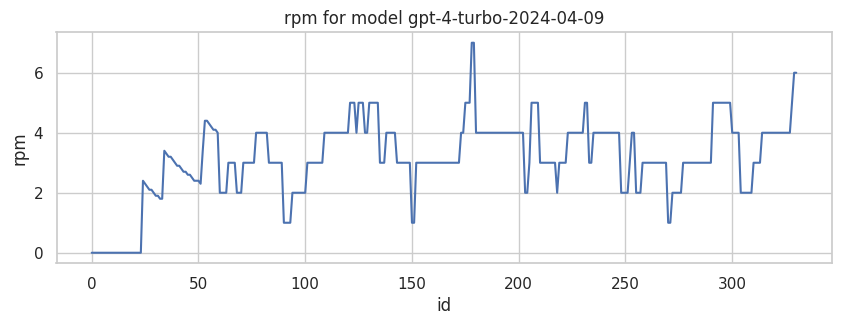

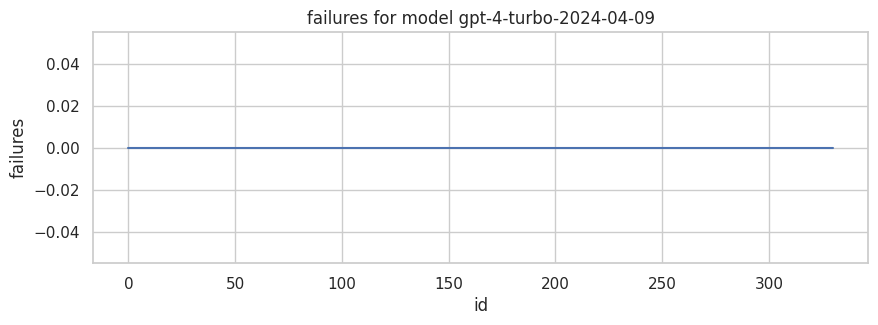

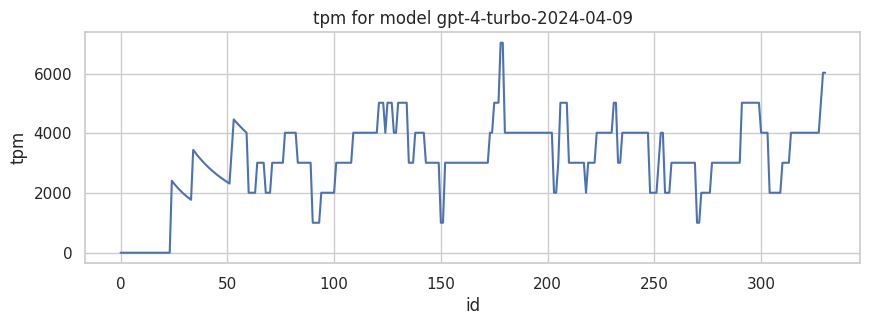

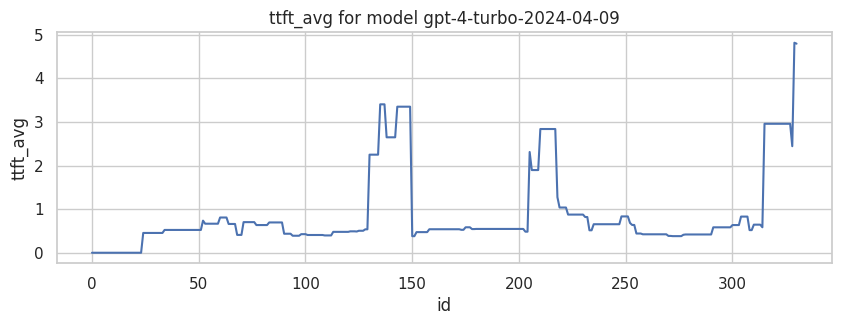

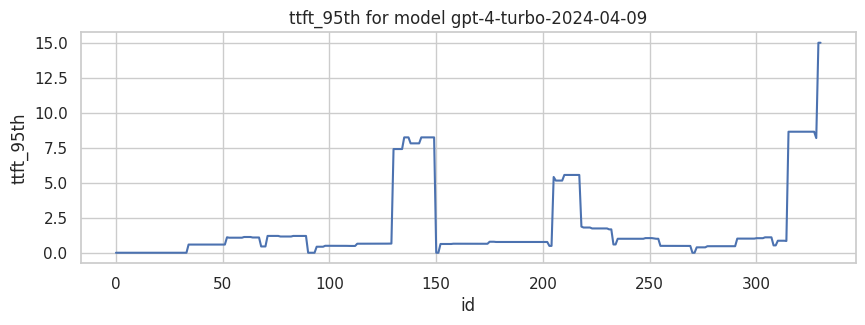

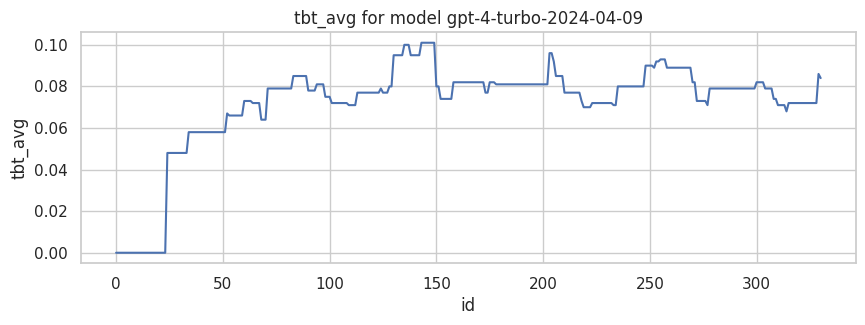

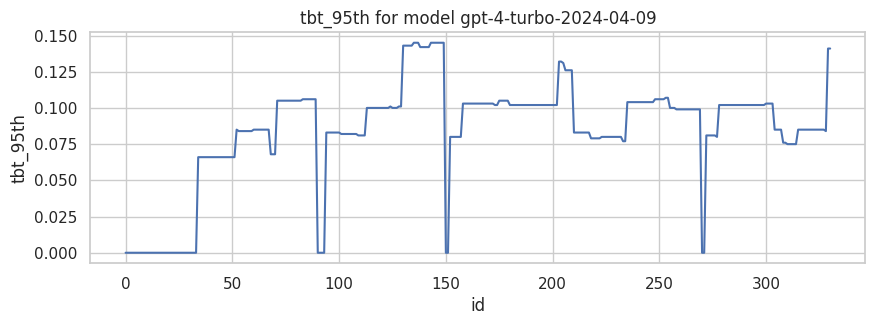

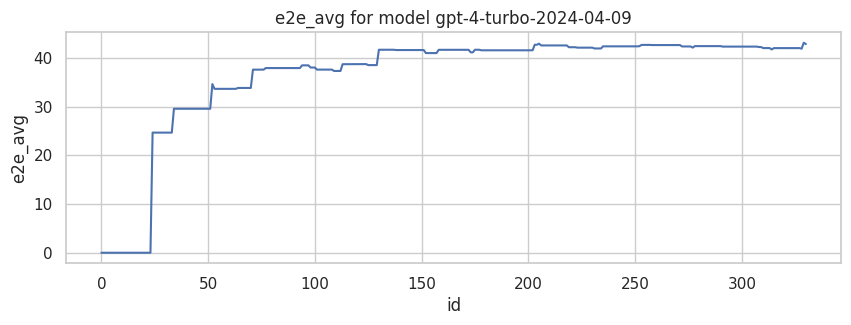

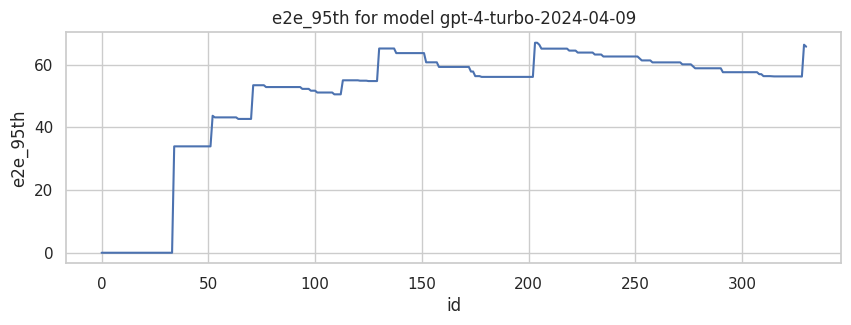

In [37]:
sns.set(style="whitegrid")

for col in cols_to_plot:
    plt.figure(figsize=(10, 3))
    sns.lineplot(data=df2, x='index', y=col)
    plt.title(f'{col} for model {MODEL2}')
    plt.xlabel('id')
    plt.ylabel(col)
    plt.show()

### 6.4 Boxplots using Plotly

In [38]:
for col in cols_to_plot:
    fig = px.box(df2, y=df2[col], title=f'{col} for model {MODEL2}')
    fig.show()

### 6.5 Boxplots using Seaborn

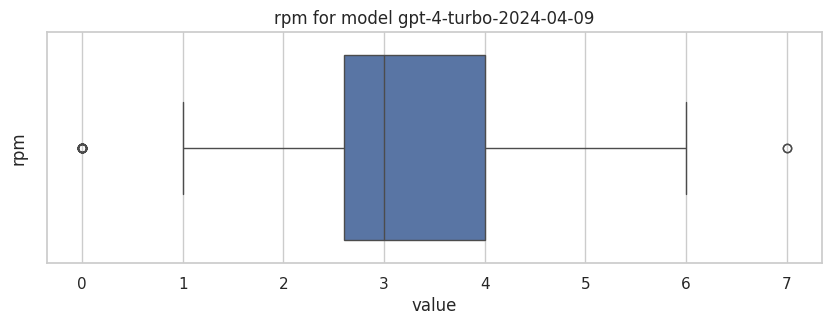

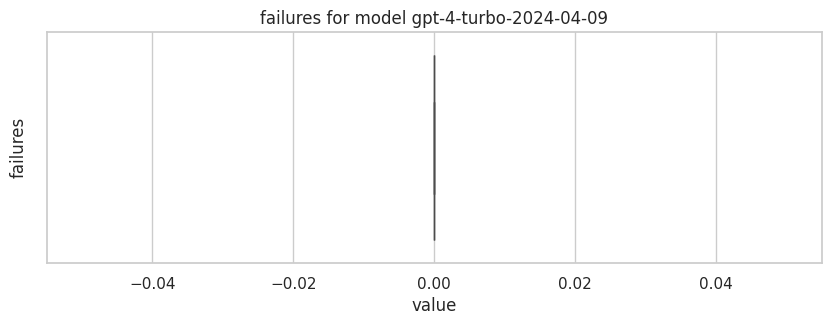

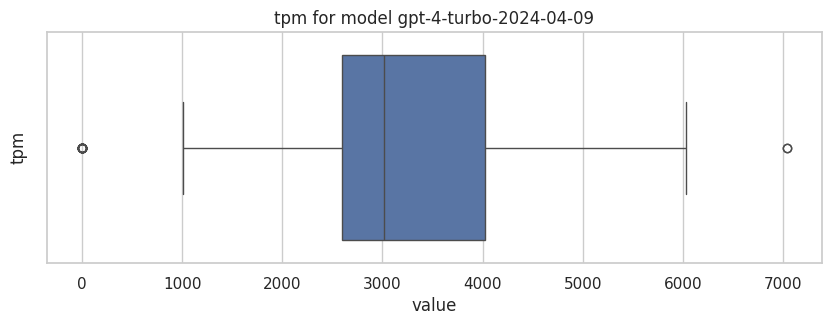

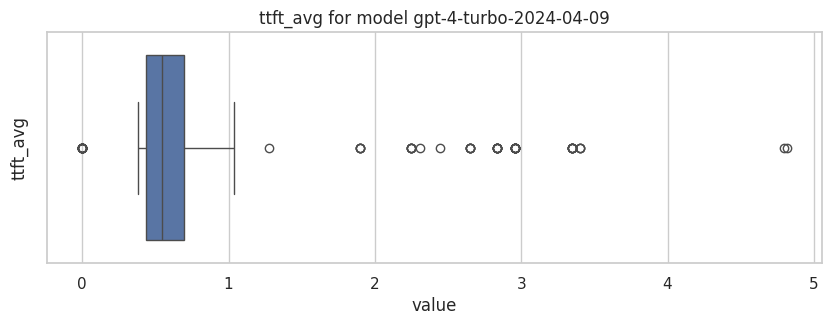

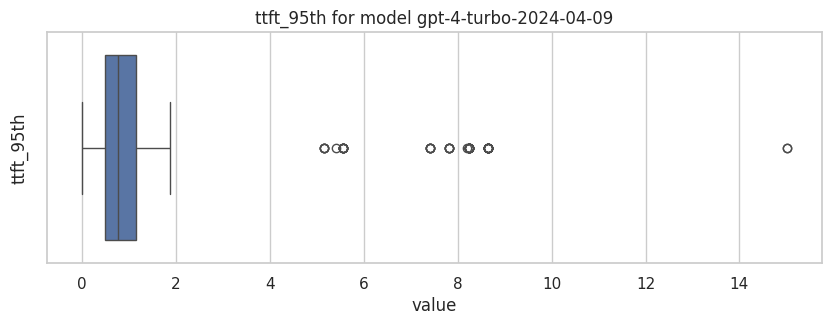

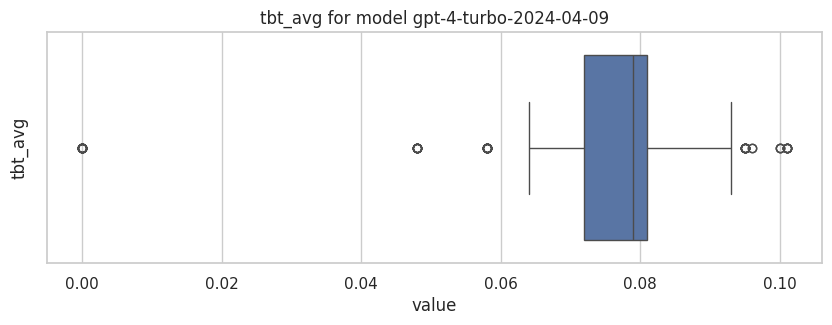

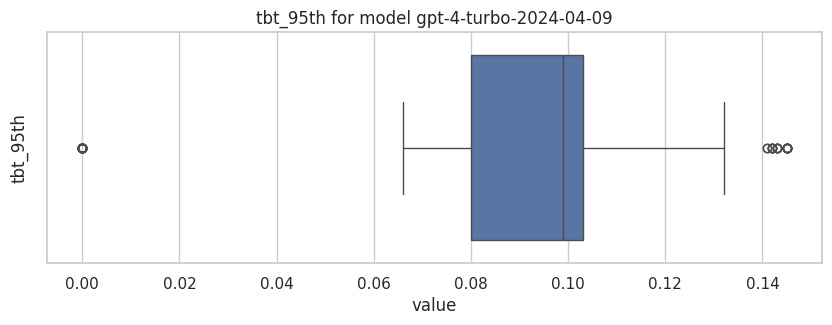

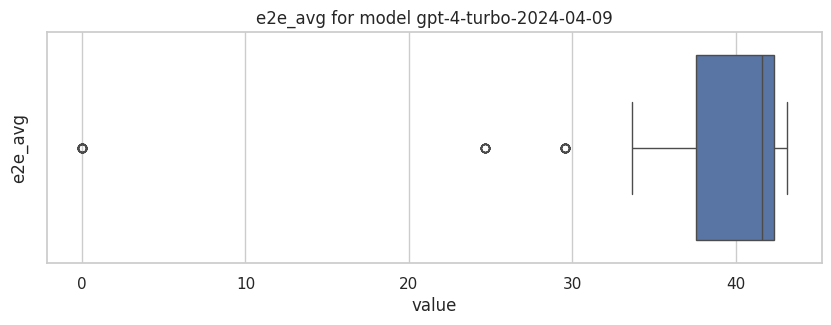

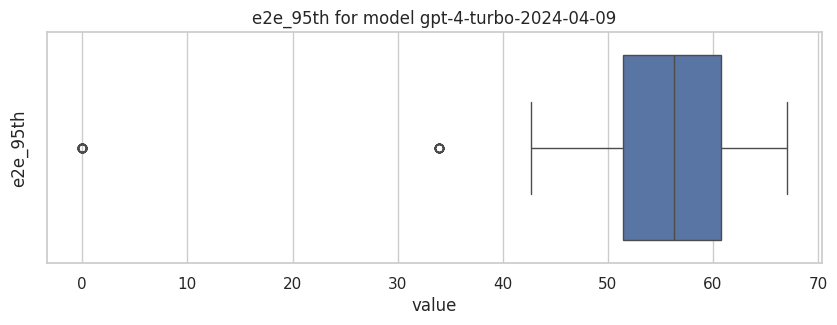

In [39]:
sns.set(style="whitegrid")

for col in cols_to_plot:
    plt.figure(figsize=(10, 3))
    sns.boxplot(x=df2[col])
    plt.title(f'{col} for model {MODEL2}')
    plt.xlabel('value')
    plt.ylabel(col)
    plt.show()

## 7. Benchmarks comparison results

In [40]:
df1.shape, df2.shape

(305, 18)

In [41]:
df2.shape

(331, 18)

In [42]:
df1.describe()

,index,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th
count,305.000000,305.000000,305.000000,305.000000,305.0,305.0,305.000000,305.000000,305.000000,305.000000,305.000000,305.000000,305.000000,305.000000,305.0,305.0
mean,152.000000,8.401311,0.862295,23.065574,0.0,0.0,23.065574,8426.780328,0.266941,0.532649,0.010561,0.011915,5.635859,6.407711,0.0,0.0
std,88.190136,1.614734,0.538689,13.229339,0.0,0.0,13.229339,1621.406442,0.180648,0.402593,0.001574,0.002055,0.810148,0.913298,0.0,0.0
min,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,76.000000,8.000000,1.000000,12.000000,0.0,0.0,12.000000,8024.000000,0.158000,0.244000,0.010000,0.011000,5.685000,6.464000,0.0,0.0
50%,152.000000,8.000000,1.000000,23.000000,0.0,0.0,23.000000,8024.000000,0.179000,0.331000,0.011000,0.012000,5.724000,6.523000,0.0,0.0
75%,228.000000,9.000000,1.000000,34.000000,0.0,0.0,34.000000,9027.000000,0.256000,0.576000,0.011000,0.013000,5.740000,6.589000,0.0,0.0
max,304.000000,17.100000,2.000000,46.000000,0.0,0.0,46.000000,17194.000000,0.746000,1.334000,0.012000,0.014000,6.301000,6.715000,0.0,0.0


In [43]:
df2.describe()

,index,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th
count,331.000000,331.000000,331.000000,331.000000,331.0,331.0,331.000000,331.000000,331.000000,331.000000,331.000000,331.000000,331.000000,331.000000,331.0,331.0
mean,165.000000,3.117221,5.957704,19.703927,0.0,0.0,19.703927,3132.882175,0.865773,1.739514,0.071773,0.084474,36.597505,50.415483,0.0,0.0
std,95.695698,1.306408,1.459979,13.734383,0.0,0.0,13.734383,1313.005680,0.892402,2.651996,0.022510,0.036740,11.112326,18.654069,0.0,0.0
min,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,82.500000,2.600000,5.000000,7.000000,0.0,0.0,7.000000,2594.000000,0.436000,0.487000,0.072000,0.080000,37.580000,51.425500,0.0,0.0
50%,165.000000,3.000000,6.000000,19.000000,0.0,0.0,19.000000,3015.000000,0.546000,0.770000,0.079000,0.099000,41.593000,56.274000,0.0,0.0
75%,247.500000,4.000000,7.000000,31.000000,0.0,0.0,31.000000,4020.000000,0.698500,1.143500,0.081000,0.103000,42.300000,60.772000,0.0,0.0
max,330.000000,7.000000,9.000000,46.000000,0.0,0.0,46.000000,7035.000000,4.815000,15.010000,0.101000,0.145000,43.090000,67.017000,0.0,0.0


In [44]:
df1['source'] = 'df1'
df2['source'] = 'df2'

### Using Plotly

In [45]:
for col in cols_to_plot:
    combined_df = pd.concat([df1[[col, 'source']], df2[[col, 'source']]])
    fig = px.box(combined_df, x="source", y=col, color='source',
                 title=f"{col} boxplots",
                 color_discrete_map={"df1": "blue", "df2": "green"})
    fig.update_xaxes(title_text="Models", tickvals=[
                     'df1', 'df2'], ticktext=[f"{MODEL1}", f"{MODEL2}"])
    fig.update_layout(showlegend=False)
    fig.show()

### Using Seaborn

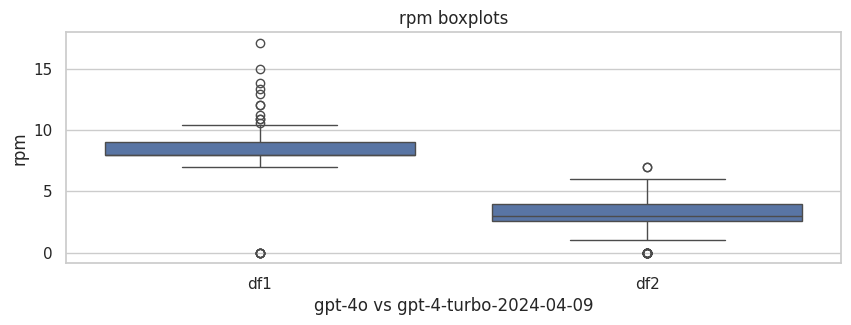

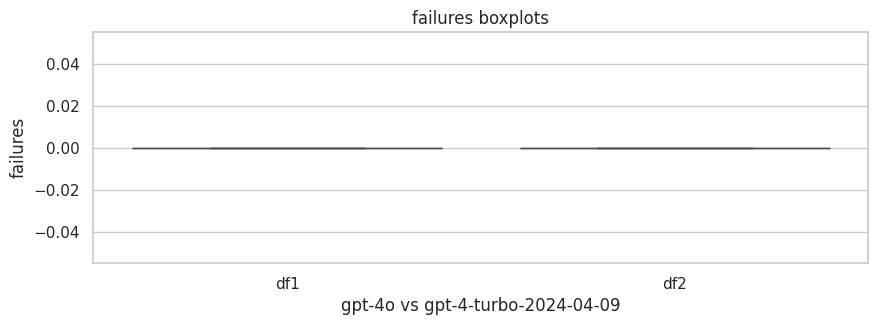

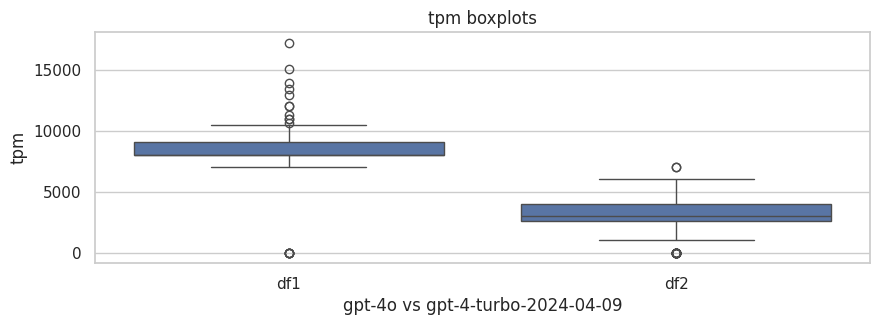

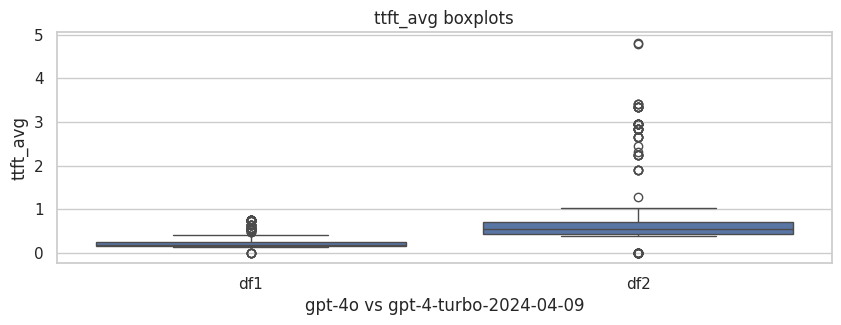

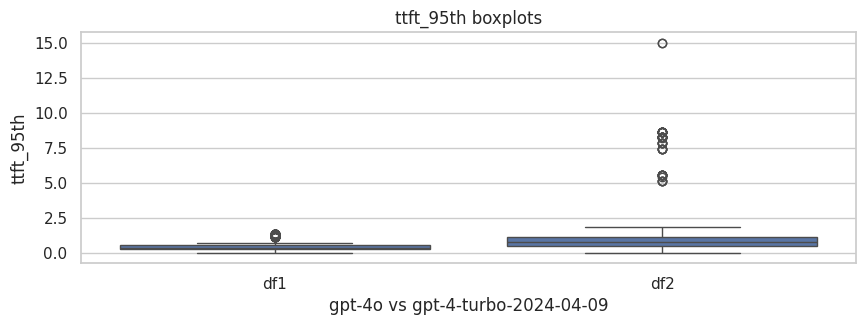

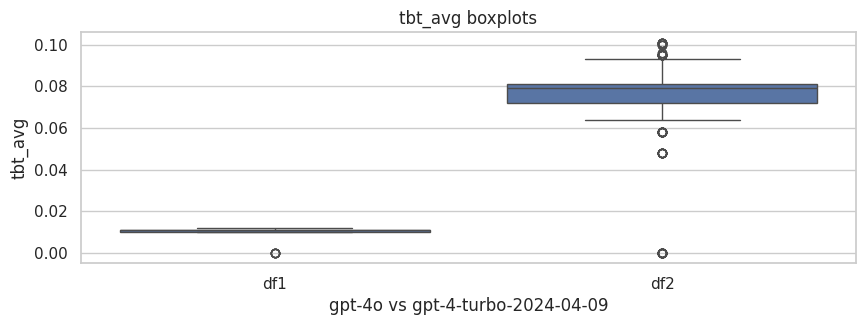

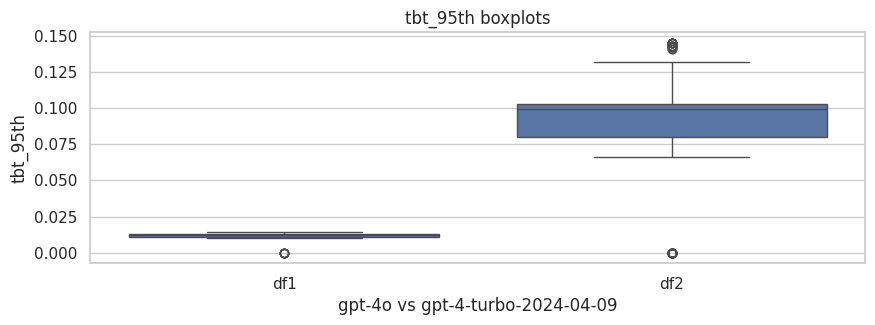

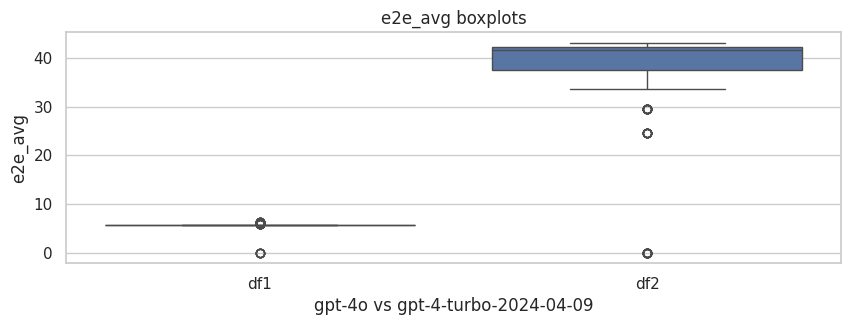

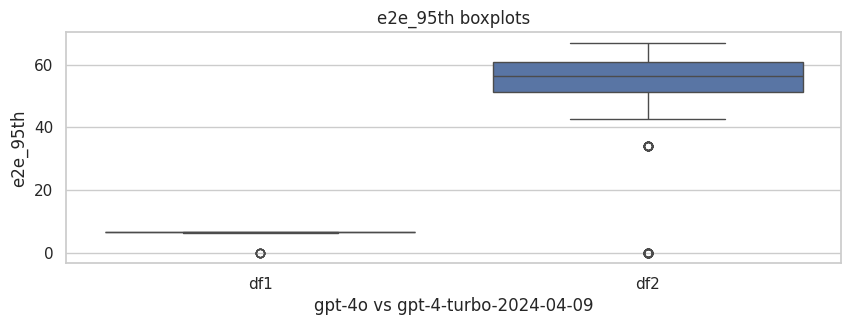

In [58]:
sns.set(style="whitegrid")

for col in cols_to_plot:
    combined_df = pd.concat([df1[[col, 'source']], df2[[col, 'source']]])
    plt.figure(figsize=(10, 3))
    sns.boxplot(x='source', y=col, data=combined_df)
    plt.title(f"{col} boxplots")
    plt.xlabel(f"{MODEL1} vs {MODEL2}")
    plt.ylabel(col)
    plt.show()

### Excel exports

In [47]:
df1.to_excel(os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL1}.xlsx"))

In [48]:
df2.to_excel(os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL2}.xlsx"))

## 8. EDA with sweetviz (optional)

In [49]:
HTML_FILE1 = os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL1}.html")

In [50]:
report1 = sv.analyze(df1)
report1.show_html(HTML_FILE1, open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/benchmarks_gpt-4o.html was generated.



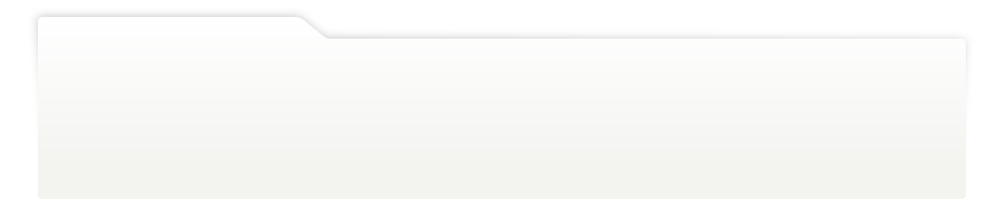
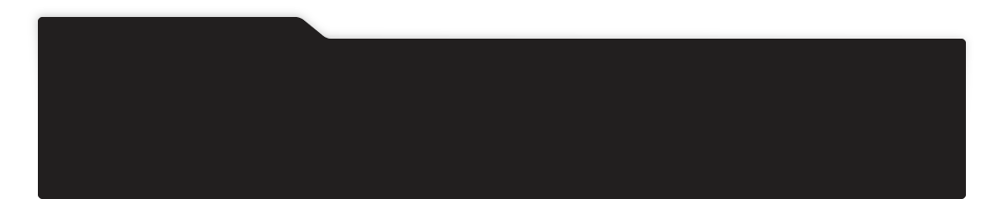
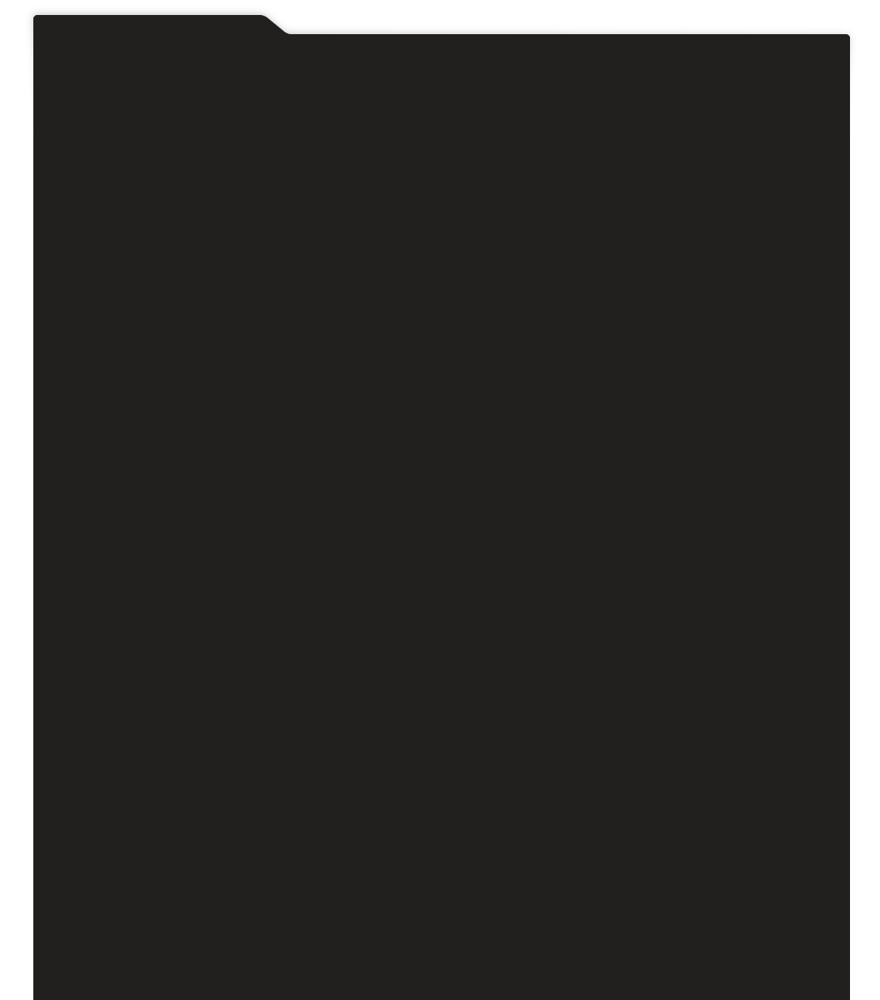
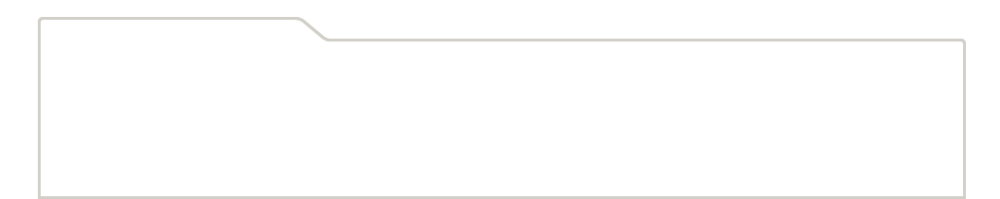
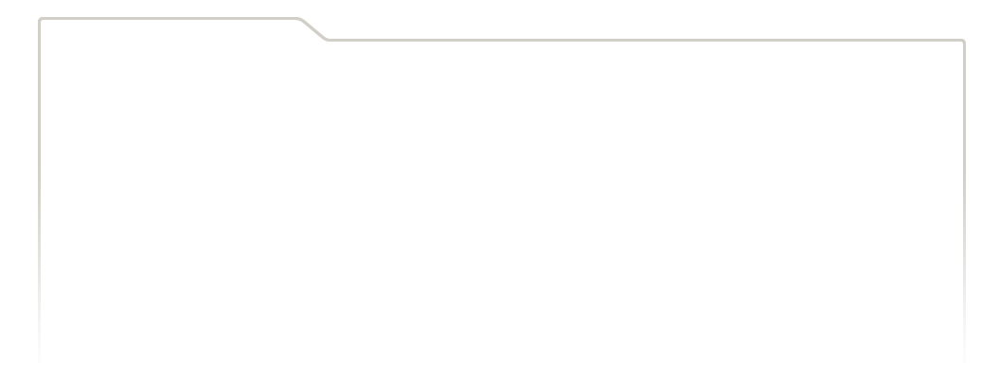
...
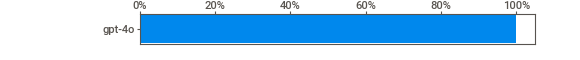
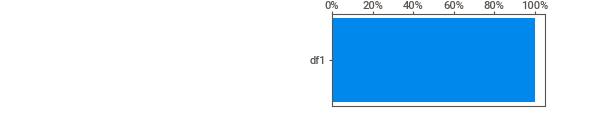
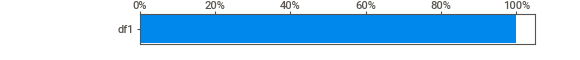
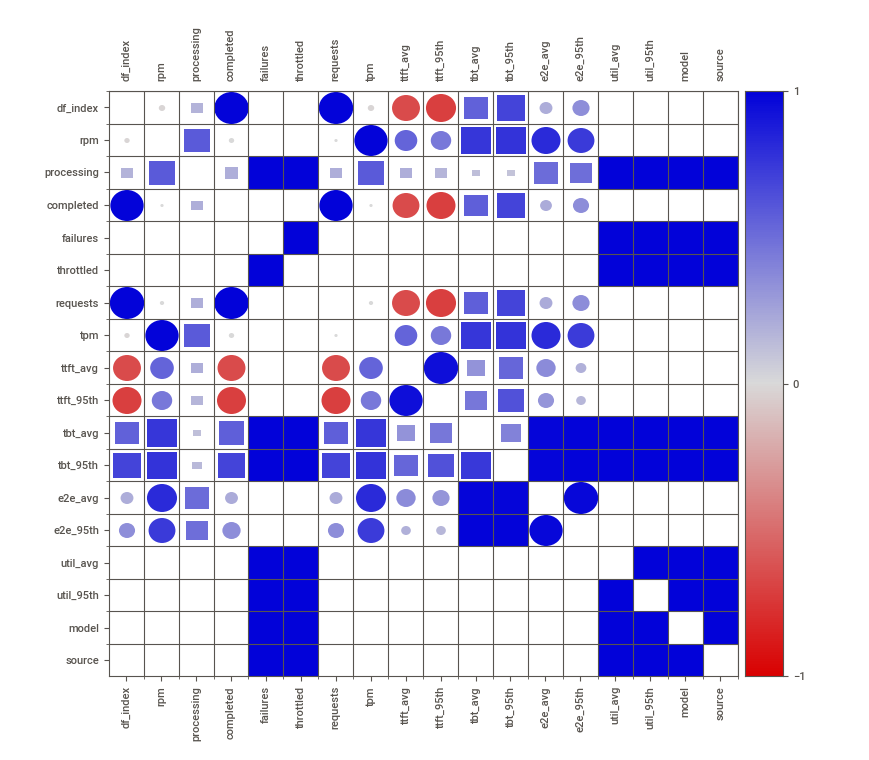
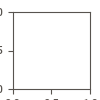

Report '/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/benchmarks_gpt-4o.html' was saved to storage.


In [51]:
report1.show_notebook(
    layout='widescreen',
    filepath=HTML_FILE1,
)

In [52]:
HTML_FILE2 = os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL2}.html")

In [53]:
report2 = sv.analyze(df2)
report2.show_html(HTML_FILE2, open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/benchmarks_gpt-4-turbo-2024-04-09.html was generated.



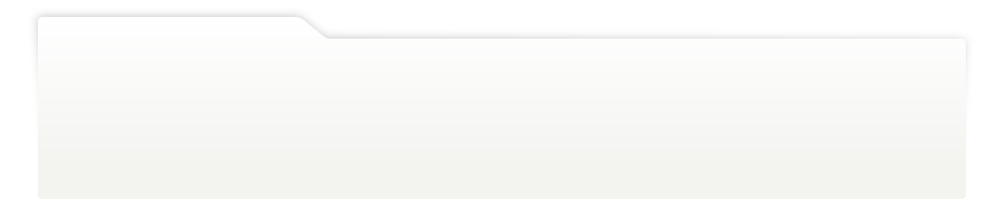
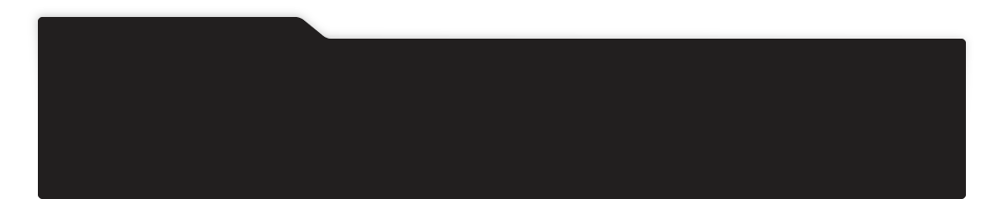
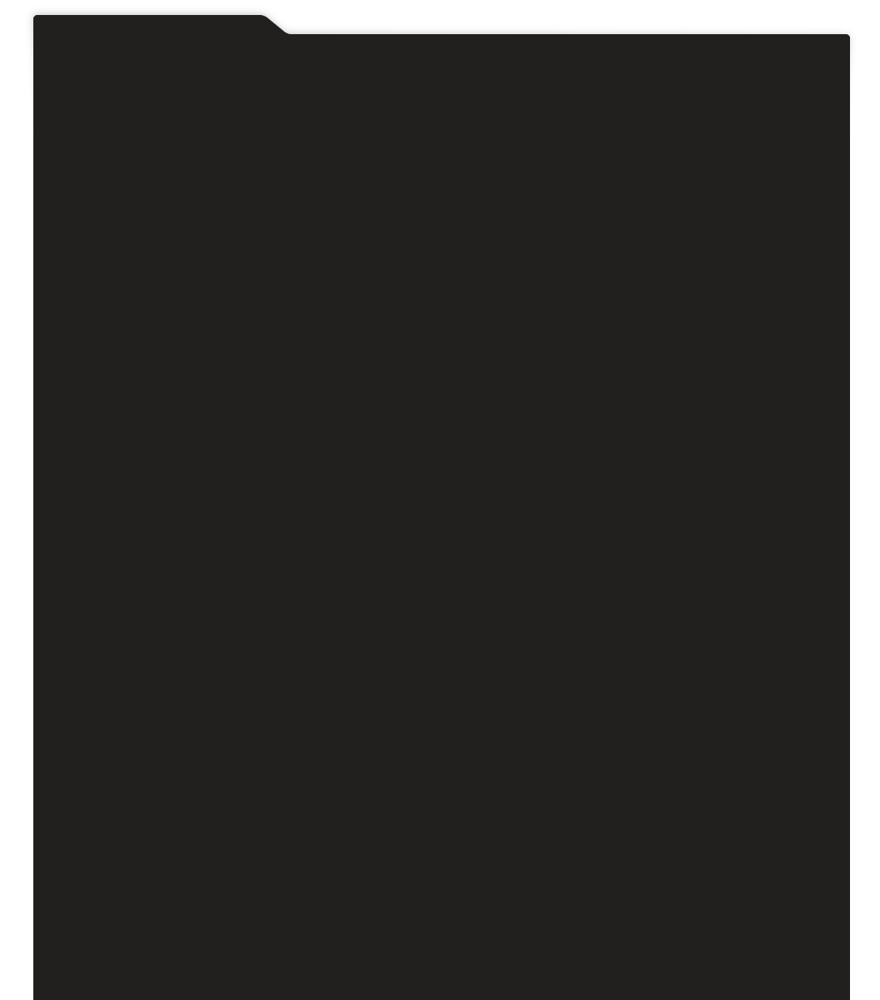
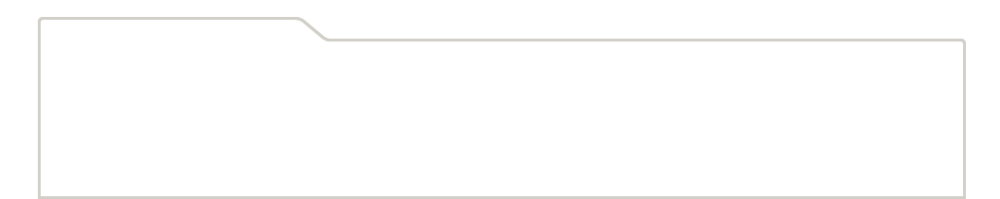
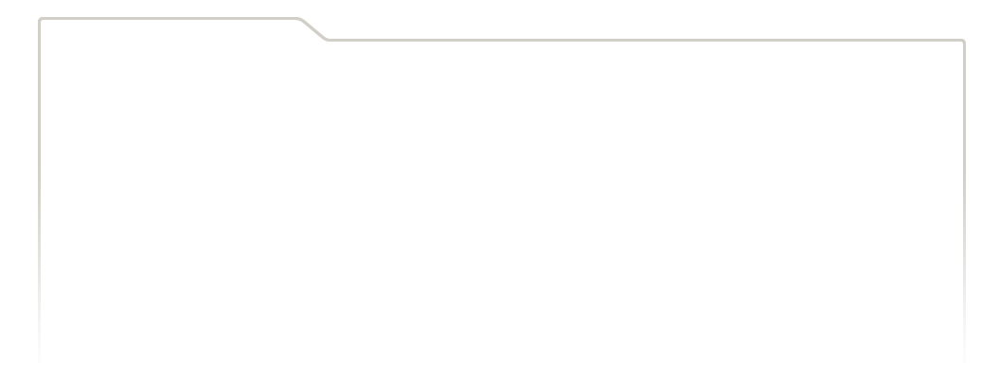
...
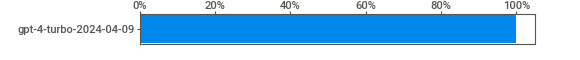
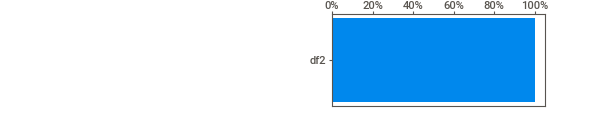
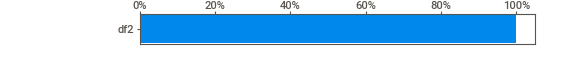
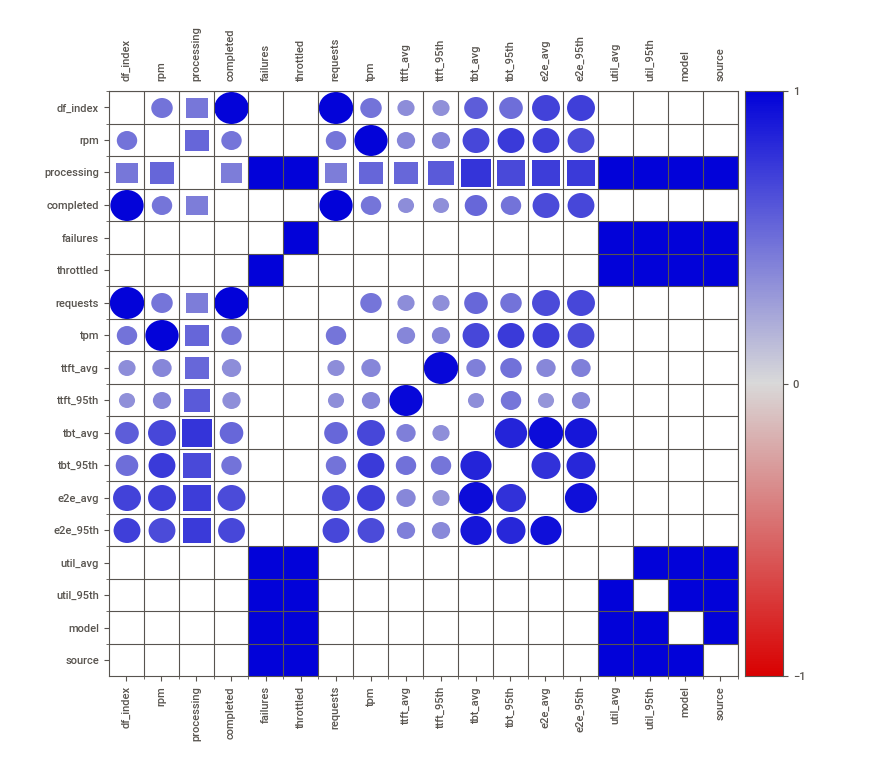
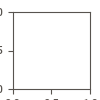

Report '/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/benchmarks_gpt-4-turbo-2024-04-09.html' was saved to storage.


In [54]:
report2.show_notebook(
    layout='widescreen',
    filepath=HTML_FILE2,
)

## 9. Saved results

In [55]:
os.chdir(HOME)

In [56]:
!ls $RESULTS_DIR/*.* -lt

-rwxrwxrwx 1 root root 1568515 Jun 19 09:26 results/benchmarks_gpt-4-turbo-2024-04-09.html
-rwxrwxrwx 1 root root 1439327 Jun 19 09:26 results/benchmarks_gpt-4o.html
-rwxrwxrwx 1 root root   29841 Jun 19 09:26 results/benchmarks_gpt-4-turbo-2024-04-09.xlsx
-rwxrwxrwx 1 root root   27637 Jun 19 09:26 results/benchmarks_gpt-4o.xlsx
-rwxrwxrwx 1 root root   86060 Jun 19 09:25 results/benchmarks_gpt-4-turbo-2024-04-09.txt
-rwxrwxrwx 1 root root   79318 Jun 19 09:20 results/benchmarks_gpt-4o.txt
